In [1]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

In [2]:
import arviz as az
import astropy.cosmology as cosmo
from astropy.cosmology import Planck18
import astropy.units as u
import dataclasses
from dataclasses import dataclass
from glob import glob
import h5py
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import pymc as pm
import pytensor
import pytensor.tensor as pt
import re
import scipy.stats as ss
import seaborn as sns
import time
from tqdm.notebook import tqdm

sns.set_theme('notebook', 'ticks', 'colorblind')

In [3]:
def pt_interp(x, xs, ys):
    """Linear interpolation."""
    x = pt.as_tensor(x)
    xs = pt.as_tensor(xs)
    ys = pt.as_tensor(ys)

    n = xs.shape[0]
    
    inds = pt.searchsorted(xs, x)
    inds = pt.where(inds <= 0, 1, inds)
    inds = pt.where(inds > n-1, n-1, inds)
    
    r = (x - xs[inds-1]) / (xs[inds] - xs[inds-1])

    return r*ys[inds] + (1-r)*ys[inds-1]

def pt_cumtrapz(ys, xs):
    xs = pt.as_tensor(xs)
    ys = pt.as_tensor(ys)

    return pt.cumsum(pt.concatenate([pt.as_tensor([0.0]), 0.5*(ys[1:] + ys[:-1])*pt.diff(xs)]))

In [4]:
def mcobhmax(mpisn, mbhmax):
    return 2*mbhmax - mpisn - 4

def quad_coeff(mpisn, mbhmax, mcobhmax):
    return (-4 + mbhmax - mcobhmax)/pt.square(4 + mcobhmax - mpisn)

def mean_mbh_from_mco(mco, mpisn, mbhmax, mcobhmax, quad_coeff):
    return pt.where(mco < mpisn - 4, mco + 4, mbhmax + quad_coeff*pt.square(mco - mcobhmax))

def log_dNdmCO(mco, a, b):
    mtr = 16.0
    x = mco/mtr
    return pt.where(mco < mtr, -a*pt.log(x), -b*pt.log(x))

def log_smooth_turnon(m, mmin, width=0.05):
    dm = mmin*width

    return np.log(2) -pt.log1p(pt.exp(-(m-mmin)/dm))

@dataclass
class LogDNDMPISN(object):
    a: object
    b: object
    mpisn: object
    mbhmax: object
    sigma: object
    mcobhmax: object = dataclasses.field(init=False)
    quad_coeff: object = dataclasses.field(init=False)
    mbh_grid: object = dataclasses.field(init=False)
    log_dN_grid: object = dataclasses.field(init=False)

    def __post_init__(self):
        self.mcobhmax = mcobhmax(self.mpisn, self.mbhmax)
        self.quad_coeff = quad_coeff(self.mpisn, self.mbhmax, self.mcobhmax)

        min_bh_mass = 5.0
        min_co_mass = min_bh_mass - 4
        max_bh_mass = self.mbhmax + 5*self.sigma 
        max_co_mass = (self.mcobhmax - pt.sqrt(self.quad_coeff*(4 - self.mbhmax))/self.quad_coeff)

        x = np.linspace(0, 1, 256)

        mbh = min_bh_mass + (max_bh_mass - min_bh_mass)*x
        mco = min_co_mass + (max_co_mass - min_co_mass)*x

        log_wts = log_dNdmCO(mco[None,:], self.a, self.b) - 0.5*pt.square((mbh[:,None] - mean_mbh_from_mco(mco[None,:], self.mpisn, self.mbhmax, self.mcobhmax, self.quad_coeff))/self.sigma) - np.log(np.sqrt(2*np.pi)) - pt.log(self.sigma)
        log_trapz = np.log(0.5) + pt.logaddexp(log_wts[:,1:], log_wts[:,:-1]) + pt.log(pt.diff(mco[None,:]))
        self.log_dN_grid = pt.logsumexp(log_trapz, axis=1)
        self.mbh_grid = mbh

    def __call__(self, m):
        return pt_interp(m, self.mbh_grid, self.log_dN_grid)
    
@dataclass
class LogDNDM(object):
    a: object
    b: object
    c: object
    mpisn: object
    mbhmax: object
    sigma: object
    fpl: object
    mref: object = 30.0
    log_norm: object = 0.0
    log_pl_norm: object = dataclasses.field(init=False)
    log_dndm_pisn: object = dataclasses.field(init=False)

    def __post_init__(self):
        self.log_dndm_pisn = LogDNDMPISN(self.a, self.b, self.mpisn, self.mbhmax, self.sigma)
        self.log_pl_norm = pt.log(self.fpl) + self.log_dndm_pisn(self.mbhmax)

        self.log_norm = -(self(np.array(self.mref)) + pt.log(self.mref)) # normalize so that m dNdm = 1 at mref

    def __call__(self, m):
        m = pt.as_tensor(m)
        log_dNdm = self.log_dndm_pisn(m)

        log_dNdm = pt.where(m <= self.log_dndm_pisn.mbh_grid[0], np.NINF, log_dNdm)
        log_dNdm = pt.where(m >= self.log_dndm_pisn.mbh_grid[-1], np.NINF, log_dNdm)

        log_dNdm = pt.logaddexp(log_dNdm, -self.c*pt.log(m/self.mbhmax) + self.log_pl_norm + log_smooth_turnon(m, self.mbhmax))

        return log_dNdm + self.log_norm
    
@dataclass
class LogDNDV(object):
    lam: object
    kappa: object
    zp: object
    zref: object = 0.0
    log_norm: object = 0.0

    def __post_init__(self):
        self.log_norm = -self(self.zref)

    def __call__(self, z):
        z = pt.as_tensor(z)

        return self.lam*pt.log1p(z) - pt.log1p(((1+z)/(1+self.zp))**self.kappa) + self.log_norm
    
@dataclass
class LogDNDMDQDV(object):
    a: object
    b: object
    c: object
    mpisn: object
    mbhmax: object
    sigma: object
    fpl: object
    beta: object
    lam: object
    kappa: object
    zp: object
    mref: object = 30.0
    qref: object = 1.0
    zref: object = 0.0
    log_dndm: object = dataclasses.field(init=False)
    log_dndv: object = dataclasses.field(init=False)


    def __post_init__(self):
        self.log_dndm = LogDNDM(self.a, self.b, self.c, self.mpisn, self.mbhmax, self.sigma, self.fpl, self.mref)
        self.log_dndv = LogDNDV(self.lam, self.kappa, self.zp, self.zref)

    def __call__(self, m1, q, z):
        m1 = pt.as_tensor(m1)
        q = pt.as_tensor(q)
        z = pt.as_tensor(z)

        m2 = q*m1
        mt = m1+m2

        return self.log_dndm(m1) + self.log_dndm(m2) + self.beta*pt.log(mt/(self.mref*(1 + self.qref))) + pt.log(m1) + self.log_dndv(z)

@dataclass
class FlatwCDMCosmology(object):
    h: object
    Om: object
    w: object
    zmax: object = 100.0
    ninterp: object = 1024
    zinterp: object = dataclasses.field(init=False)
    dcinterp: object = dataclasses.field(init=False)
    dlinterp: object = dataclasses.field(init=False)
    ddlinterp: object = dataclasses.field(init=False)
    vcinterp: object = dataclasses.field(init=False)
    dvcinterp: object = dataclasses.field(init=False)

    def __post_init__(self):
        self.zinterp = pt.expm1(np.linspace(np.log(1), np.log(1+self.zmax), self.ninterp))
        self.dcinterp = self.dH*pt_cumtrapz(1/self.E(self.zinterp), self.zinterp)
        self.dlinterp = self.dcinterp*(1+self.zinterp)
        self.ddlinterp = self.dcinterp + self.dH*(1+self.zinterp)/self.E(self.zinterp)
        self.vcinterp = 4/3*np.pi*self.dcinterp*self.dcinterp*self.dcinterp
        self.dvcinterp = 4*np.pi*pt.square(self.dcinterp)*self.dH/self.E(self.zinterp)

    @property
    def dH(self):
        return 2.99792 / self.h
    
    @property
    def Ol(self):
        return 1-self.Om
    
    @property
    def om(self):
        return self.Om*pt.square(self.h)
    
    @property
    def ol(self):
        return self.Ol*pt.square(self.h)
    
    def E(self, z):
        opz = 1 + z
        opz3 = opz*opz*opz
        return pt.sqrt(self.Om*opz3 + (1-self.Om)*opz**(3*(1 + self.w)))

    def dC(self, z):
        return pt_interp(z, self.zinterp, self.dcinterp)
    def dL(self, z):
        return pt_interp(z, self.zinterp, self.dlinterp)
    def VC(self, z):
        return pt_interp(z, self.zinterp, self.vcinterp)
    def dVCdz(self, z):
        return pt_interp(z, self.zinterp, self.dvcinterp)
    
    def ddL_dz(self, z):
        return pt_interp(z, self.zinterp, self.ddlinterp)

    def z_of_dC(self, dC):
        return pt_interp(dC, self.dcinterp, self.zinterp)
    def z_of_dL(self, dL):
        return pt_interp(dL, self.dlinterp, self.zinterp)


In [5]:
def make_pop_model(m1s, qs, zs, pdraw, m1s_sel, qs_sel, zs_sel, pdraw_sel, Ndraw):
    nobs = m1s.shape[0]
    nsamp = m1s.shape[1]

    nsel = m1s_sel.shape[0]

    log_pdraw = np.log(pdraw)
    log_pdraw_sel = np.log(pdraw_sel)

    zmax = 100
    zinterp = np.expm1(np.linspace(np.log1p(0), np.log1p(zmax), 1024))
    dVdzdt_interp = 4*np.pi*Planck18.differential_comoving_volume(zinterp).to(u.Gpc**3/u.sr).value/(1+zinterp)

    coords = {
        'obs': np.arange(nobs),
        'samp': np.arange(nsamp),
        'sel': np.arange(nsel),
        'm_grid': np.exp(np.linspace(np.log(5), np.log(150), 128)),
        'q_grid': np.linspace(0, 1, 129)[1:],
        'z_grid': np.expm1(np.linspace(np.log1p(0), np.log1p(3), 128))
    }
    
    with pm.Model(coords=coords) as model:
        m1s = pm.ConstantData('m1', m1s, dims=['obs', 'samp'])
        qs = pm.ConstantData('q', qs, dims=['obs', 'samp'])
        zs = pm.ConstantData('z', zs, dims=['obs', 'samp'])

        m1s_sel = pm.ConstantData('m1_sel', m1s_sel, dims='sel')
        qs_sel = pm.ConstantData('q_sel', qs_sel, dims='sel')
        zs_sel = pm.ConstantData('z_sel', zs_sel, dims='sel')

        a = pm.Normal('a', 2.35, 2)
        b = pm.Normal('b', 1.9, 2)
        c = pm.Normal('c', 4, 2)

        mpisn = pm.Normal('mpisn', 35.0, 5.0)
        dmbhmax = pm.Truncated('dmbhmax', pm.Normal.dist(5.0, 2.0), lower=0.0)
        mbhmax = pm.Deterministic('mbhmax', mpisn + dmbhmax)
        sigma = pm.Truncated('sigma', pm.Normal.dist(2, 2), lower=1.0)

        beta = pm.Normal('beta', 0, 2)

        log_fpl = pm.Uniform('log_fpl', np.log(1e-3), np.log(0.5))
        fpl = pm.Deterministic('fpl', pt.exp(log_fpl))
        
        lam = pm.Truncated('lam', pm.Normal.dist(2.7, 2.0), lower=-1, upper=5.0)
        dkappa = pm.Truncated('dkappa', pm.Normal.dist(5.6-2.7, 2.0), lower=1)
        kappa = pm.Deterministic('kappa', lam + dkappa)
        zp = pm.Truncated('zp', pm.Normal.dist(1.9, 1), lower=0)

        log_dN = LogDNDMDQDV(a, b, c, mpisn, mbhmax, sigma, fpl, beta, lam, kappa, zp)

        log_wts = log_dN(m1s, qs, zs) + pt.log(pt_interp(zs, zinterp, dVdzdt_interp)) - log_pdraw
        log_like = pt.logsumexp(log_wts, axis=1) - pt.log(nsamp)
        _ = pm.Potential('loglike', pt.sum(log_like))

        log_sel_wts = log_dN(m1s_sel, qs_sel, zs_sel) + pt.log(pt_interp(zs_sel, zinterp, dVdzdt_interp)) - log_pdraw_sel
        log_mu_sel = pt.logsumexp(log_sel_wts) - pt.log(Ndraw)
        _ = pm.Potential('selfactor', -nobs*log_mu_sel)

        log_mu2 = pt.logsumexp(2*log_sel_wts) - 2*pt.log(Ndraw)
        log_s2 = log_mu2 + pt.log1p(-pt.exp(2*log_mu_sel - pt.log(Ndraw) - log_mu2))
        _ = pm.Deterministic('neff_sel', pt.exp(2*log_mu_sel - log_s2))

        mu_sel = pt.exp(log_mu_sel)

        R = pm.Normal('R', nobs/mu_sel, pt.sqrt(nobs)/mu_sel)

        _ = pm.Deterministic('neff', pt.exp(2*pt.logsumexp(log_wts, axis=1) - pt.logsumexp(2*log_wts, axis=1)), dims='obs')

        _ = pm.Deterministic('mdNdmdVdt_fixed_qz', coords['m_grid']*R*pt.exp(log_dN(coords['m_grid'], log_dN.qref, log_dN.zref)), dims='m_grid')
        _ = pm.Deterministic('dNdqdVdt_fixed_mz', log_dN.mref*R*pt.exp(log_dN(log_dN.mref, coords['q_grid'], log_dN.zref)), dims='q_grid')
        _ = pm.Deterministic('dNdVdt_fixed_mq', log_dN.mref*R*pt.exp(log_dN(log_dN.mref, log_dN.qref, coords['z_grid'])), dims='z_grid')

    return model

def make_pop_cosmo_model(m1s_det, qs, dls, pdraw, m1s_det_sel, qs_sel, dls_sel, pdraw_sel, Ndraw):
    nobs = m1s_det.shape[0]
    nsamp = m1s_det.shape[1]

    nsel = m1s_det_sel.shape[0]

    log_pdraw = np.log(pdraw)
    log_pdraw_sel = np.log(pdraw_sel)

    coords = {
        'obs': np.arange(nobs),
        'samp': np.arange(nsamp),
        'sel': np.arange(nsel),
        'm_grid': np.exp(np.linspace(np.log(5), np.log(150), 128)),
        'q_grid': np.linspace(0, 1, 129)[1:],
        'z_grid': np.expm1(np.linspace(np.log1p(0), np.log1p(3), 128))
    }
    
    with pm.Model(coords=coords) as model:
        m1s_det = pm.ConstantData('m1_det', m1s_det, dims=['obs', 'samp'])
        qs = pm.ConstantData('q', qs, dims=['obs', 'samp'])
        dls = pm.ConstantData('dl', dls, dims=['obs', 'samp'])

        m1s_det_sel = pm.ConstantData('m1_det_sel', m1s_det_sel, dims='sel')
        qs_sel = pm.ConstantData('q_sel', qs_sel, dims='sel')
        dls_sel = pm.ConstantData('dl_sel', dls_sel, dims='sel')

        h = pm.Truncated('h', pm.Normal.dist(0.7, 0.2), lower=0.35, upper=1.4)
        Om = pm.Truncated('Om', pm.Normal.dist(0.3, 0.1), lower=0, upper=1)
        w = pm.Truncated('w', pm.Normal.dist(-1.0, 0.25), lower=-1.5, upper=-0.5)

        a = pm.Normal('a', 2.35, 2)
        b = pm.Normal('b', 1.9, 2)
        c = pm.Normal('c', 4, 2)

        mpisn = pm.Normal('mpisn', 35.0, 5.0)
        dmbhmax = pm.Truncated('dmbhmax', pm.Normal.dist(5.0, 2.0), lower=0.0)
        mbhmax = pm.Deterministic('mbhmax', mpisn + dmbhmax)
        sigma = pm.Truncated('sigma', pm.Normal.dist(2, 2), lower=1.0)

        beta = pm.Normal('beta', 0, 2)

        log_fpl = pm.Uniform('log_fpl', np.log(1e-3), np.log(0.5))
        fpl = pm.Deterministic('fpl', pt.exp(log_fpl))
        
        lam = pm.Truncated('lam', pm.Normal.dist(2.7, 2.0), lower=-1, upper=5.0)
        dkappa = pm.Truncated('dkappa', pm.Normal.dist(5.6-2.7, 2.0), lower=1)
        kappa = pm.Deterministic('kappa', lam + dkappa)
        zp = pm.Truncated('zp', pm.Normal.dist(1.9, 1), lower=0)

        cosmo = FlatwCDMCosmology(h, Om, w)

        log_dN = LogDNDMDQDV(a, b, c, mpisn, mbhmax, sigma, fpl, beta, lam, kappa, zp)

        zs = cosmo.z_of_dL(dls)
        m1s = m1s_det / (1 + zs)

        log_wts = log_dN(m1s, qs, zs) - 2*pt.log1p(zs) + pt.log(cosmo.dVCdz(zs)) - pt.log(cosmo.ddL_dz(zs)) - log_pdraw
        log_like = pt.logsumexp(log_wts, axis=1) - pt.log(nsamp)
        _ = pm.Potential('loglike', pt.sum(log_like))

        zs_sel = cosmo.z_of_dL(dls_sel)
        m1s_sel = m1s_det_sel / (1 + zs_sel)

        log_sel_wts = log_dN(m1s_sel, qs_sel, zs_sel) - 2*pt.log1p(zs_sel) + pt.log(cosmo.dVCdz(zs_sel)) - pt.log(cosmo.ddL_dz(zs_sel)) - log_pdraw_sel
        log_mu_sel = pt.logsumexp(log_sel_wts) - pt.log(Ndraw)
        _ = pm.Potential('selfactor', -nobs*log_mu_sel)

        log_mu2 = pt.logsumexp(2*log_sel_wts) - 2*pt.log(Ndraw)
        log_s2 = log_mu2 + pt.log1p(-pt.exp(2*log_mu_sel - pt.log(Ndraw) - log_mu2))
        _ = pm.Deterministic('neff_sel', pt.exp(2*log_mu_sel - log_s2))

        mu_sel = pt.exp(log_mu_sel)

        R = pm.Normal('R', nobs/mu_sel, pt.sqrt(nobs)/mu_sel)

        _ = pm.Deterministic('neff', pt.exp(2*pt.logsumexp(log_wts, axis=1) - pt.logsumexp(2*log_wts, axis=1)), dims='obs')

        _ = pm.Deterministic('mdNdmdVdt_fixed_qz', coords['m_grid']*R*pt.exp(log_dN(coords['m_grid'], log_dN.qref, log_dN.zref)), dims='m_grid')
        _ = pm.Deterministic('dNdqdVdt_fixed_mz', log_dN.mref*R*pt.exp(log_dN(log_dN.mref, coords['q_grid'], log_dN.zref)), dims='q_grid')
        _ = pm.Deterministic('dNdVdt_fixed_mq', log_dN.mref*R*pt.exp(log_dN(log_dN.mref, log_dN.qref, coords['z_grid'])), dims='z_grid')
        _ = pm.Deterministic('hz', cosmo.h*cosmo.E(coords['z_grid']), dims='z_grid')

    return model

In [44]:
trace.posterior.mean(dim=['chain', 'draw'])

<xarray.Dataset>
Dimensions:             (obs: 56, m_grid: 128, q_grid: 128, z_grid: 128)
Coordinates:
  * obs                 (obs) int64 0 1 2 3 4 5 6 7 ... 48 49 50 51 52 53 54 55
  * m_grid              (m_grid) float64 5.0 5.136 5.275 ... 142.2 146.0 150.0
  * q_grid              (q_grid) float64 0.007812 0.01562 0.02344 ... 0.9922 1.0
  * z_grid              (z_grid) float64 0.0 0.01098 0.02207 ... 2.914 2.957 3.0
Data variables: (12/20)
    a                   float64 1.501
    b                   float64 -0.6153
    c                   float64 2.009
    mpisn               float64 32.83
    beta                float64 -1.726
    R                   float64 2.618
    ...                  ...
    kappa               float64 7.238
    neff_sel            float64 1.186e+04
    neff                (obs) float64 227.7 252.6 245.7 ... 214.1 253.8 246.4
    mdNdmdVdt_fixed_qz  (m_grid) float64 4.465e-06 22.68 23.82 ... 0.0198 0.0212
    dNdqdVdt_fixed_mz   (q_grid) float64 2.606e+05 1.733e+03 ... 2.595 2.618
    dNdVdt_fixed_mq     (z_grid) float64 2.618 2.719 2.825 ... 120.0 120.5 120.9

In [45]:
def li_prior_wt(m1, q, z):
    return 4*np.pi*(1+z)*m1*(1+z)*np.square(Planck18.luminosity_distance(z).to(u.Gpc).value)*(Planck18.comoving_distance(z).to(u.Gpc).value + (1+z)*Planck18.hubble_distance.to(u.Gpc).value/Planck18.efunc(z))

m = pt.dvector('m1')
q = pt.dvector('q')
z = pt.dvector('z')
default_log_dNdmdqdV = pytensor.function([m,q,z], LogDNDMDQDV(1.5, -0.62, 2.0, 33.0, 38.0, 2.6, 0.15, -1.7, 2.7, 5.6, 1.9)(m,q,z))

def desired_pop_wt(m1, q, z):
    return 4.0*np.pi*np.exp(default_log_dNdmdqdV(m1, q, z))*Planck18.differential_comoving_volume(z).to(u.Gpc**3/u.sr).value/(1+z)

In [46]:
gwtc = pd.read_csv('../src/data/GWTC.csv')

In [47]:
nsamp = 512
fnames = []
m1s = []
qs = []
zs = []
pdraws = []
for f in glob('/Users/wfarr/Research/o3a_posterior_samples/all_posterior_samples/GW[0-9]*[0-9].h5'):
    gwname = re.match('^.*(GW[0-9_]+[0-9]+).*.h5$', f)[1]

    try:
        evt = gwtc[gwtc.commonName == gwname].iloc[0]
    except IndexError:
        print('skipping {:s} because not found in GWTC table'.format(gwname))
        continue

    if evt.far < 1:
        with h5py.File(f, 'r') as file:
            samples = np.array(file['PublicationSamples/posterior_samples'])
            median_m2 = np.median(samples['mass_2_source'])
            if median_m2 < 5:
                print(f'Skipping {gwname} because median m2 = {median_m2:.1f}')
                continue

            m1 = np.array(samples['mass_1_source'])
            q = np.array(samples['mass_ratio'])
            z = np.array(samples['redshift'])

            pop_wt = desired_pop_wt(m1, q, z)
            wt = pop_wt / li_prior_wt(m1, q, z)
            wt = wt / np.sum(wt)

            ns = 1/np.sum(wt*wt)
            if ns < nsamp:
                print('skipping {:s} due to too few samples: {:.1f}'.format(gwname, ns))
                continue

            inds = np.random.choice(np.arange(len(samples)), nsamp, p=wt)
            m1s.append(m1[inds])
            qs.append(q[inds])
            zs.append(z[inds])
            pdraws.append(pop_wt[inds])

        fnames.append(f)
    else:
        print('skipping {:s} due to high FAR {:g}'.format(gwname, evt.far))
for f in glob('/Users/wfarr/Research/o3b_data/PE/*GW*_nocosmo.h5'):
    gwname = re.match('^.*(GW[0-9_]+[0-9]+).*.h5$', f)[1]

    try:
        evt = gwtc[gwtc.commonName == gwname].iloc[0]
    except IndexError:
        print('skipping {:s} because not found in GWTC table'.format(gwname))
        continue

    if evt.far < 1:
        with h5py.File(f, 'r') as file:
            samples = np.array(file['C01:Mixed/posterior_samples'])
            median_m2 = np.median(samples['mass_2_source'])
            if median_m2 < 5:
                print(f'Skipping {gwname} because median m2 = {median_m2:.1f}')
                continue

            try:
                m1 = np.array(samples['mass_1_source'])
                q = np.array(samples['mass_ratio'])
                z = np.array(samples['redshift'])

                pop_wt = desired_pop_wt(m1, q, z)
                wt = pop_wt / li_prior_wt(m1, q, z)
                wt = wt / np.sum(wt)

                ns = 1/np.sum(wt*wt)
                if ns < nsamp:
                    print('skipping {:s} due to too few samples: {:.1f}'.format(gwname, ns))
                    continue

                inds = np.random.choice(np.arange(len(samples)), nsamp, p=wt)
                m1s.append(m1[inds])
                qs.append(q[inds])
                zs.append(z[inds])
                pdraws.append(pop_wt[inds])
                fnames.append(f)
            except ValueError:
                print(f'Could not process event {gwname}')
    else:
        print('skipping {:s} due to high FAR {:g}'.format(gwname, evt.far))


m1s = np.array(m1s)
qs = np.array(qs)
zs = np.array(zs)
pdraws = np.array(pdraws)

skipping GW190909_114149 due to high FAR 26.183
skipping GW190424_180648 due to high FAR 9.03879
Skipping GW190426_152155 because median m2 = 1.5
Skipping GW190814 because median m2 = 2.6
skipping GW190514_065416 due to high FAR 2.8
Skipping GW190425 because median m2 = 1.4
skipping GW200322_091133 due to high FAR 140
skipping GW191126_115259 due to high FAR 3.2
skipping GW200220_061928 due to high FAR 6.8
skipping GW191219_163120 due to high FAR 4
skipping GW200210_092254 due to high FAR 1.2
skipping GW200105_162426 because not found in GWTC table
skipping GW200220_124850 due to high FAR 30
skipping GW200308_173609 due to high FAR 2.4
Skipping GW200115_042309 because median m2 = 1.4
skipping GW191113_071753 due to high FAR 26
skipping GW200208_222617 due to high FAR 4.8
skipping GW200306_093714 due to high FAR 24
skipping GW191204_110529 due to high FAR 3.3


Text(0, 0.5, '$m_2 / M_\\odot$')

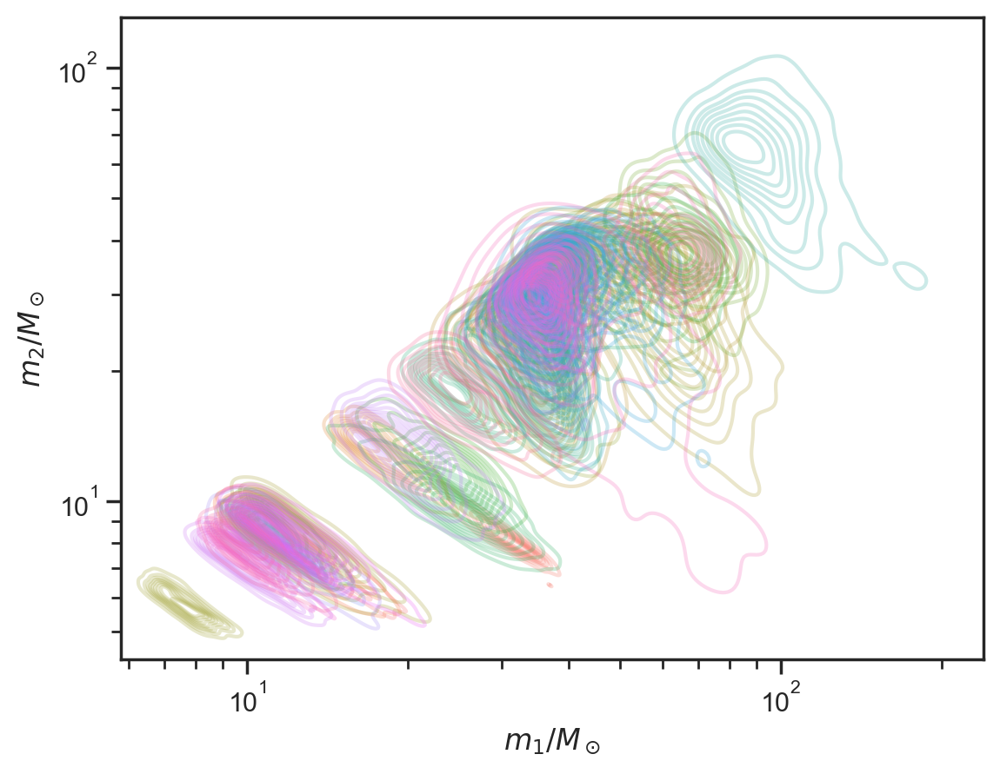

In [48]:
with sns.color_palette('husl', n_colors=m1s.shape[0]):
    for i in range(m1s.shape[0]):
        sns.kdeplot(x=m1s[i,:], y=qs[i,:]*m1s[i,:], log_scale=True, alpha=0.25)
plt.xlabel(r'$m_1 / M_\odot$')
plt.ylabel(r'$m_2 / M_\odot$')

Text(0, 0.5, '$m_1 / M_\\odot$')

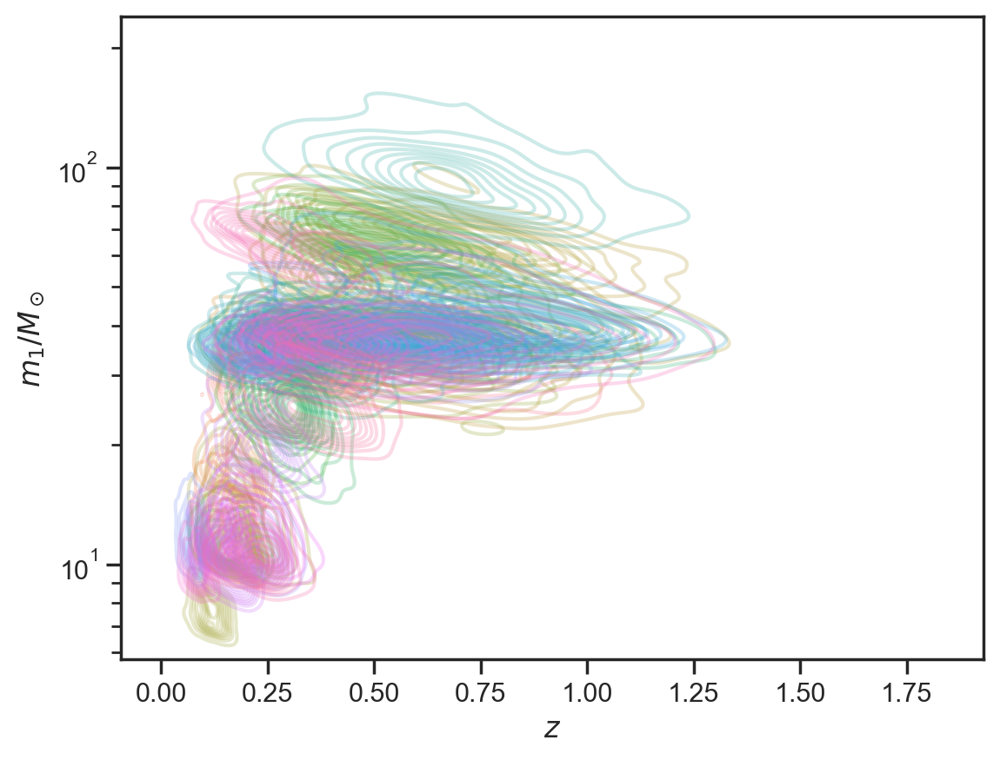

In [49]:
with sns.color_palette('husl', n_colors=m1s.shape[0]):
    for i in range(m1s.shape[0]):
        sns.kdeplot(x=zs[i,:], y=m1s[i,:], log_scale=(False, True), alpha=0.25)
plt.xlabel(r'$z$')
plt.ylabel(r'$m_1 / M_\odot$')

In [50]:
with h5py.File('/Users/wfarr/Research/o3b_data/O3-Sensitivity/endo3_bbhpop-LIGO-T2100113-v12.hdf5', 'r') as f:
    m1s_sel = np.array(f['injections/mass1_source'])
    qs_sel = np.array(f['injections/mass2_source'])/m1s_sel
    zs_sel = np.array(f['injections/redshift'])
    pdraw_sel = np.array(f['injections/mass1_source_mass2_source_sampling_pdf'])*np.array(f['injections/redshift_sampling_pdf'])*m1s_sel

    pycbc_far = np.array(f['injections/far_pycbc_hyperbank'])
    pycbc_bbh_far = np.array(f['injections/far_pycbc_bbh'])
    gstlal_far = np.array(f['injections/far_gstlal'])
    mbta_far = np.array(f['injections/far_mbta'])

    far_threshold = 1 # per year
    detected = (pycbc_far < far_threshold) | (pycbc_bbh_far < far_threshold) | (gstlal_far < far_threshold) | (mbta_far < far_threshold)

    ndraw = f.attrs['n_accepted'] + f.attrs['n_rejected']

    T = (f.attrs['end_time_s'] - f.attrs['start_time_s'])/(3600.0*24.0*365.25) 
    pdraw_sel /= T

    m1s_sel = m1s_sel[detected]
    qs_sel = qs_sel[detected]
    zs_sel = zs_sel[detected]
    pdraw_sel = pdraw_sel[detected]

In [54]:
nsel = 4096

pop_wt = desired_pop_wt(m1s_sel, qs_sel, zs_sel)
unnorm_wt = pop_wt/pdraw_sel
sum_norm_wt = unnorm_wt / np.sum(unnorm_wt)
pdraw_wt = pop_wt / (np.sum(unnorm_wt) / ndraw)

print('Approximately {:.0f} independent samples remain after reweighting'.format(1/np.sum(sum_norm_wt*sum_norm_wt)))

inds = np.random.choice(len(m1s_sel), size=nsel, p=sum_norm_wt)
m1s_sel_cut = m1s_sel[inds]
qs_sel_cut = qs_sel[inds]
zs_sel_cut = zs_sel[inds]
pdraw_sel_cut = pdraw_wt[inds]
ndraw_cut = nsel

Approximately 17003 independent samples remain after reweighting


In [55]:
model = make_pop_model(m1s, qs, zs, pdraws, m1s_sel_cut, qs_sel_cut, zs_sel_cut, pdraw_sel_cut, ndraw_cut)

In [56]:
reload = False

if reload:
    trace = az.from_netcdf('../src/data/trace.nc')
else:
    nmcmc = 1000
    chains = 4
    with tqdm(total=2*nmcmc*chains, smoothing=10/(2*nmcmc*chains)) as bar:
        with model:
            trace = pm.sample(draws=nmcmc, tune=nmcmc, chains=chains, progressbar=False, init='jitter+adapt_full', callback=lambda draw, trace: bar.update(1))

  0%|          | 0/8000 [00:00<?, ?it/s]

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_full...
/Users/wfarr/miniconda3/envs/BumpCosmology/lib/python3.11/site-packages/pymc/step_methods/hmc/quadpotential.py:629: UserWarning: QuadPotentialFullAdapt is an experimental feature
  warnings.warn("QuadPotentialFullAdapt is an experimental feature")
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [a, b, c, mpisn, dmbhmax, sigma, beta, log_fpl, lam, dkappa, zp, R]
Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 878 seconds.
There were 78 divergences after tuning. Increase `target_accept` or reparameterize.


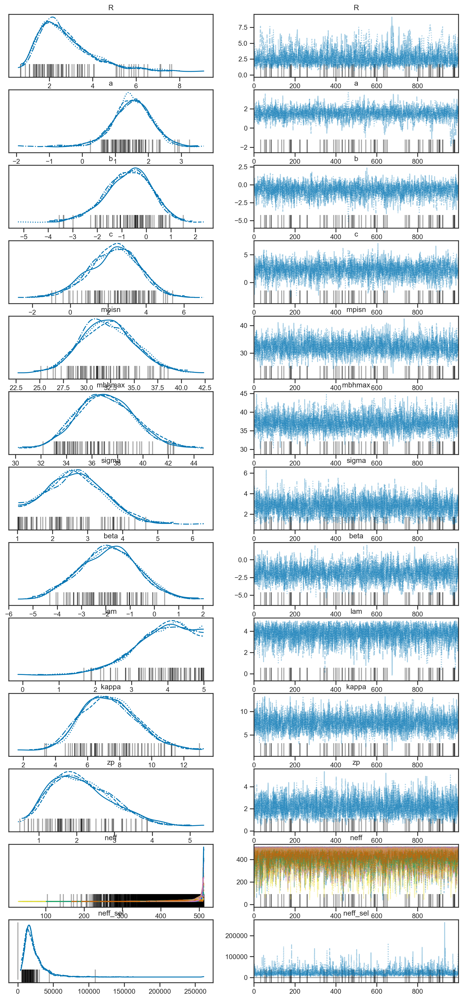

In [57]:
with model:
    az.plot_trace(trace, lines=[('neff_sel', {}, 4*m1s.shape[0])], var_names=['R', 'a', 'b', 'c', 'mpisn', 'mbhmax', 'sigma', 'beta', 'lam', 'kappa', 'zp', 'neff', 'neff_sel'])

In [58]:
if not reload:
    az.to_netcdf(trace, '../src/data/trace.nc')

In [59]:
trace.posterior.neff_sel.min()

<xarray.DataArray 'neff_sel' ()>
array(3251.78756673)

In [60]:
trace.posterior.neff.min(dim=['chain','draw'])

<xarray.DataArray 'neff' (obs: 56)>
array([303.57251277, 333.89985372, 377.36746414, 333.81079328,
       212.12492524, 416.79239726, 372.32155799, 198.58115703,
        76.63178618, 291.48560282,  30.77685651, 103.56648905,
       347.67180927, 483.24681921, 263.74707211, 239.24376899,
       127.38377926,  40.81639364, 397.49641186, 378.49945662,
        39.32068941, 345.57083465, 151.66664668, 392.7555597 ,
       300.52575885, 186.48439534, 149.93133959, 311.45432928,
        27.24001811, 156.89083736, 300.84164718, 187.72337678,
       262.89421207, 259.84391844, 145.65943717, 223.7780909 ,
       171.13311947, 146.13250397, 163.82031924, 296.12511758,
       382.06556273, 270.30125685, 352.02254059, 223.41547984,
       330.51895407, 439.78749689, 399.02536069, 346.62380209,
       264.80635375, 222.76412052, 432.76870909, 167.21047782,
       101.25558531, 166.59228972, 403.86251798, 346.20722225])
Coordinates:
  * obs      (obs) int64 0 1 2 3 4 5 6 7 8 9 ... 46 47 48 49 50 51 52 53 54 55

Text(0, 0.5, '$\\left. m_1 \\mathrm{d} N/\\mathrm{d} m_1 \\mathrm{d} q \\mathrm{d} V \\mathrm{d} t \\right|_{q=1, z=0} / \\mathrm{Gpc}^{-3} \\, \\mathrm{yr}^{-1}$')

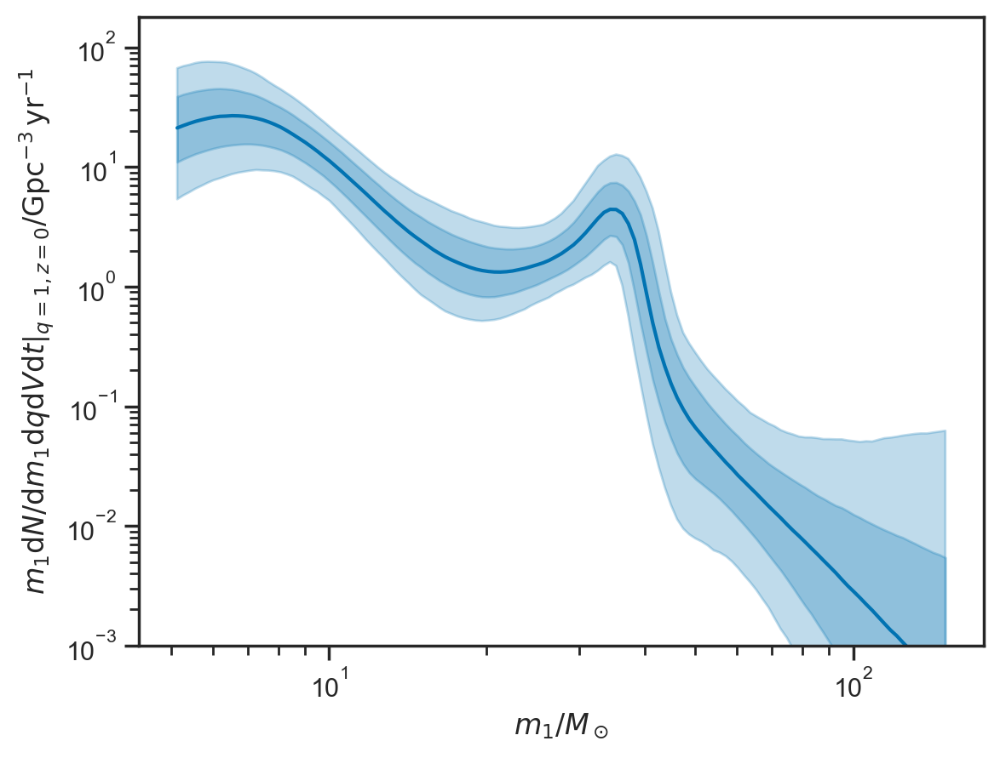

In [61]:
d = ['chain', 'draw']
m = trace.posterior.coords['m_grid']
dN = trace.posterior['mdNdmdVdt_fixed_qz']
l, = plt.plot(m[1:], dN.median(dim=d)[1:])
c = l.get_color()
for (l,h) in [(0.16, 0.84), (0.025, 0.975)]:
    plt.fill_between(m[1:], dN.quantile(h, dim=d)[1:], dN.quantile(l, dim=d)[1:], color=c, alpha=0.25)
plt.xscale('log')
plt.yscale('log')
plt.ylim(bottom=1e-3)
plt.xlabel(r'$m_1 / M_\odot$')
plt.ylabel(r'$\left. m_1 \mathrm{d} N/\mathrm{d} m_1 \mathrm{d} q \mathrm{d} V \mathrm{d} t \right|_{q=1, z=0} / \mathrm{Gpc}^{-3} \, \mathrm{yr}^{-1}$')

Text(0, 0.5, '$\\left. m_1 \\mathrm{d} N/\\mathrm{d} m_1 \\mathrm{d} q \\mathrm{d} V \\mathrm{d} t \\right|_{m_1=30\\,M_\\odot, z=0} / \\mathrm{Gpc}^{-3} \\, \\mathrm{yr}^{-1}$')

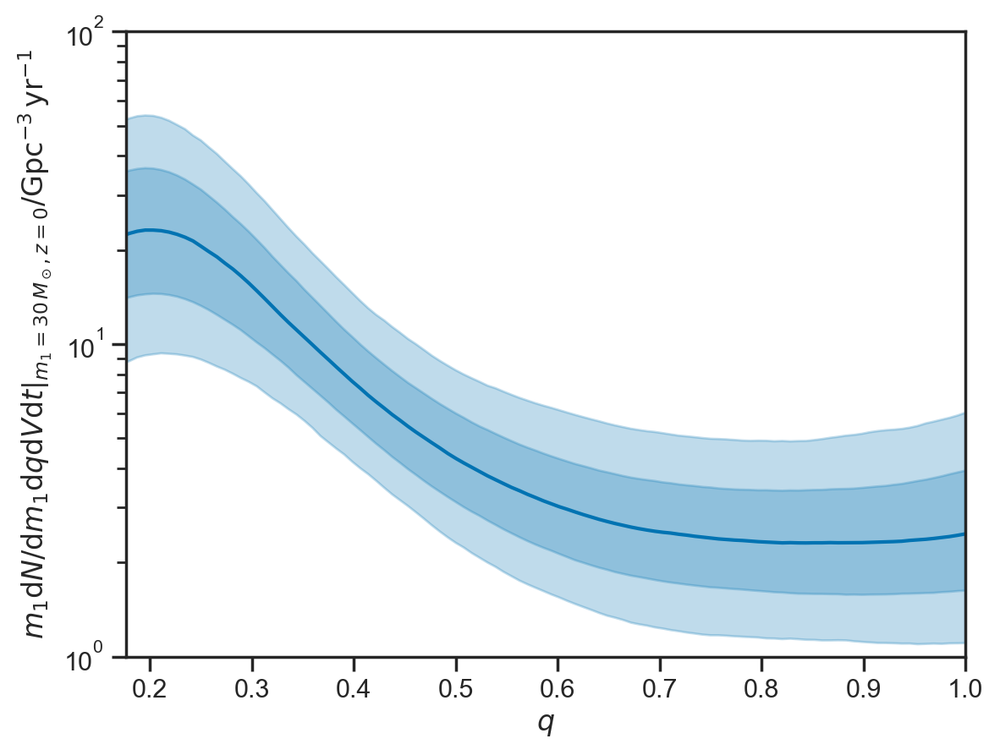

In [66]:
d = ['chain', 'draw']
q = trace.posterior.coords['q_grid']
dN = trace.posterior['dNdqdVdt_fixed_mz']
l, = plt.plot(q, dN.median(dim=d))
c = l.get_color()
for (l,h) in [(0.16, 0.84), (0.025, 0.975)]:
    plt.fill_between(q, dN.quantile(h, dim=d), dN.quantile(l, dim=d), color=c, alpha=0.25)
plt.yscale('log')
plt.xlim(left=5/30+0.01, right=1)
plt.ylim(bottom=1, top=1e2)
plt.xlabel(r'$q$')
plt.ylabel(r'$\left. m_1 \mathrm{d} N/\mathrm{d} m_1 \mathrm{d} q \mathrm{d} V \mathrm{d} t \right|_{m_1=30\,M_\odot, z=0} / \mathrm{Gpc}^{-3} \, \mathrm{yr}^{-1}$')

Text(0, 0.5, '$\\left. m_1 \\mathrm{d} N/\\mathrm{d} m_1 \\mathrm{d} q \\mathrm{d} V \\mathrm{d} t \\right|_{m_1=30\\,M_\\odot, q=1} / \\mathrm{Gpc}^{-3} \\, \\mathrm{yr}^{-1}$')

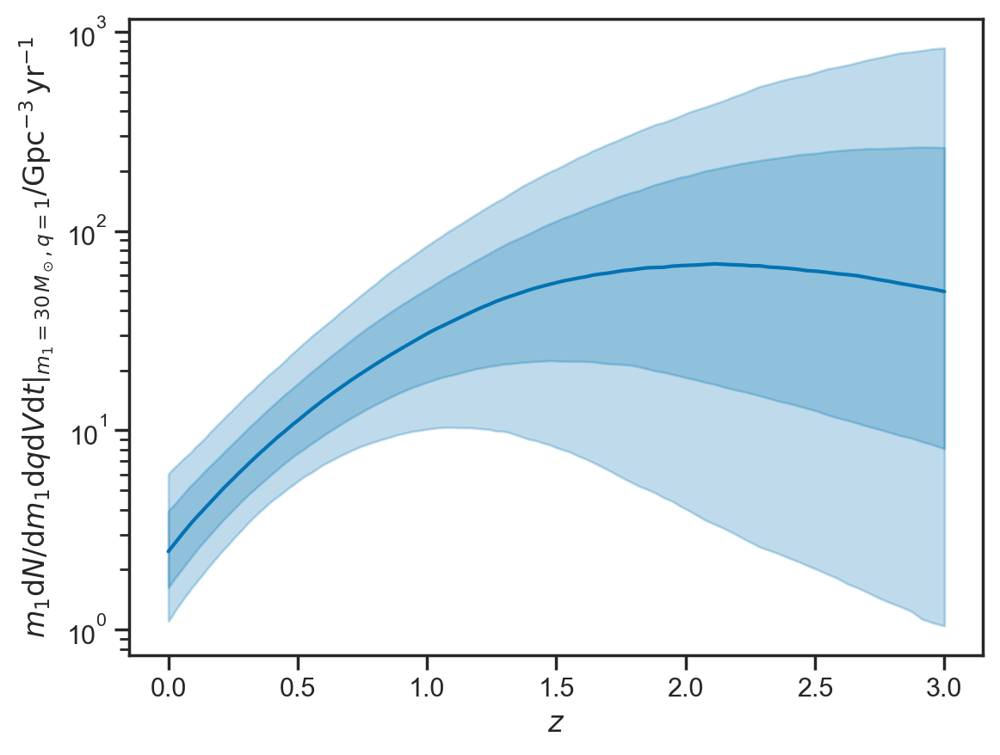

In [67]:
d = ['chain', 'draw']
z = trace.posterior.coords['z_grid']
dN = trace.posterior['dNdVdt_fixed_mq']
l, = plt.plot(z, dN.median(dim=d))
c = l.get_color()
for (l,h) in [(0.16, 0.84), (0.025, 0.975)]:
    plt.fill_between(z, dN.quantile(h, dim=d), dN.quantile(l, dim=d), color=c, alpha=0.25)
plt.yscale('log')
plt.xlabel(r'$z$')
plt.ylabel(r'$\left. m_1 \mathrm{d} N/\mathrm{d} m_1 \mathrm{d} q \mathrm{d} V \mathrm{d} t \right|_{m_1=30\,M_\odot, q=1} / \mathrm{Gpc}^{-3} \, \mathrm{yr}^{-1}$')

In [68]:
m1s_det = m1s * (1 + zs)
dls = Planck18.luminosity_distance(zs).to(u.Gpc).value
pdraws_det = pdraws / (1 + zs) / (Planck18.comoving_distance(zs).to(u.Gpc).value + (1+zs)*Planck18.hubble_distance.to(u.Gpc).value/Planck18.efunc(zs))

m1s_det_sel_cut = m1s_sel_cut * (1 + zs_sel_cut)
dls_sel_cut = Planck18.luminosity_distance(zs_sel_cut).to(u.Gpc).value
pdraw_det_sel_cut = pdraw_sel_cut / (1+zs_sel_cut) / (Planck18.comoving_distance(zs_sel_cut).to(u.Gpc).value + (1+zs_sel_cut)*Planck18.hubble_distance.to(u.Gpc).value/Planck18.efunc(zs_sel_cut))

In [69]:
model_cosmo = make_pop_cosmo_model(m1s_det, qs, dls, pdraws_det, m1s_det_sel_cut, qs_sel_cut, dls_sel_cut, pdraw_det_sel_cut, ndraw_cut)

In [71]:
reload_cosmo = False

if reload_cosmo:
    trace = az.from_netcdf('../src/data/trace_cosmo.nc')
else:
    nmcmc = 1000
    chains = 4
    with tqdm(total=2*nmcmc*chains, smoothing=10/(2*nmcmc*chains)) as bar:
        with model_cosmo:
            trace_cosmo = pm.sample(draws=nmcmc, tune=nmcmc, chains=chains, progressbar=False, init='jitter+adapt_full', callback=lambda draw, trace: bar.update(1))

  0%|          | 0/8000 [00:00<?, ?it/s]

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_full...
/Users/wfarr/miniconda3/envs/BumpCosmology/lib/python3.11/site-packages/pymc/step_methods/hmc/quadpotential.py:629: UserWarning: QuadPotentialFullAdapt is an experimental feature
  warnings.warn("QuadPotentialFullAdapt is an experimental feature")
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [h, Om, w, a, b, c, mpisn, dmbhmax, sigma, beta, log_fpl, lam, dkappa, zp, R]
Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 2086 seconds.
There were 136 divergences after tuning. Increase `target_accept` or reparameterize.


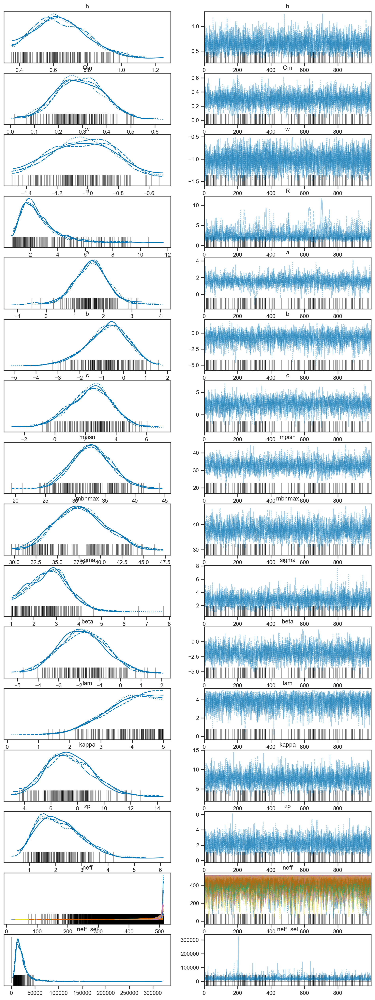

In [72]:
with model_cosmo:
    az.plot_trace(trace_cosmo, lines=[('neff_sel', {}, 4*m1s.shape[0])],
                  var_names=['h', 'Om', 'w', 'R', 'a', 'b', 'c', 'mpisn', 'mbhmax', 'sigma', 'beta', 'lam', 'kappa', 'zp', 'neff', 'neff_sel'])

In [73]:
if not reload_cosmo:
    az.to_netcdf(trace_cosmo, '../src/data/trace_cosmo.nc')

In [74]:
trace_cosmo.posterior.neff_sel.min()

<xarray.DataArray 'neff_sel' ()>
array(1946.06676807)

In [75]:
trace_cosmo.posterior.neff.min(dim=['chain','draw'])

<xarray.DataArray 'neff' (obs: 56)>
array([262.36847647, 366.438083  , 418.74357962, 363.67066753,
       167.8216511 , 344.08665833, 338.42641229, 191.36956018,
        28.04692178, 247.05689842,  15.84269472,  33.00235445,
       374.39509831, 394.58192897, 225.97103187, 199.88226711,
        89.31360379,  17.49521953, 419.13158241, 349.71913963,
        50.10785886, 363.23937677, 126.51659755, 392.25888534,
       280.83253693, 179.45998902, 109.86418241, 277.10662773,
        26.72266527, 156.99859384, 259.07104427, 114.22946602,
       245.85013852, 244.92501064,  94.07796753, 259.39331931,
       133.02479283, 114.2070413 , 127.11066191, 271.14555993,
       407.26514725, 228.95997012, 374.45019197, 173.19261433,
       293.38487803, 447.7057218 , 420.90380324, 374.97886233,
       262.13285424, 220.32345715, 448.26262218, 181.30467132,
       137.3467992 ,  72.90874659, 417.68701157, 352.62846113])
Coordinates:
  * obs      (obs) int64 0 1 2 3 4 5 6 7 8 9 ... 46 47 48 49 50 51 52 53 54 55

Text(0, 0.5, '$\\left. m_1 \\mathrm{d} N/\\mathrm{d} m_1 \\mathrm{d} q \\mathrm{d} V \\mathrm{d} t \\right|_{q=1, z=0} / \\mathrm{Gpc}^{-3} \\, \\mathrm{yr}^{-1}$')

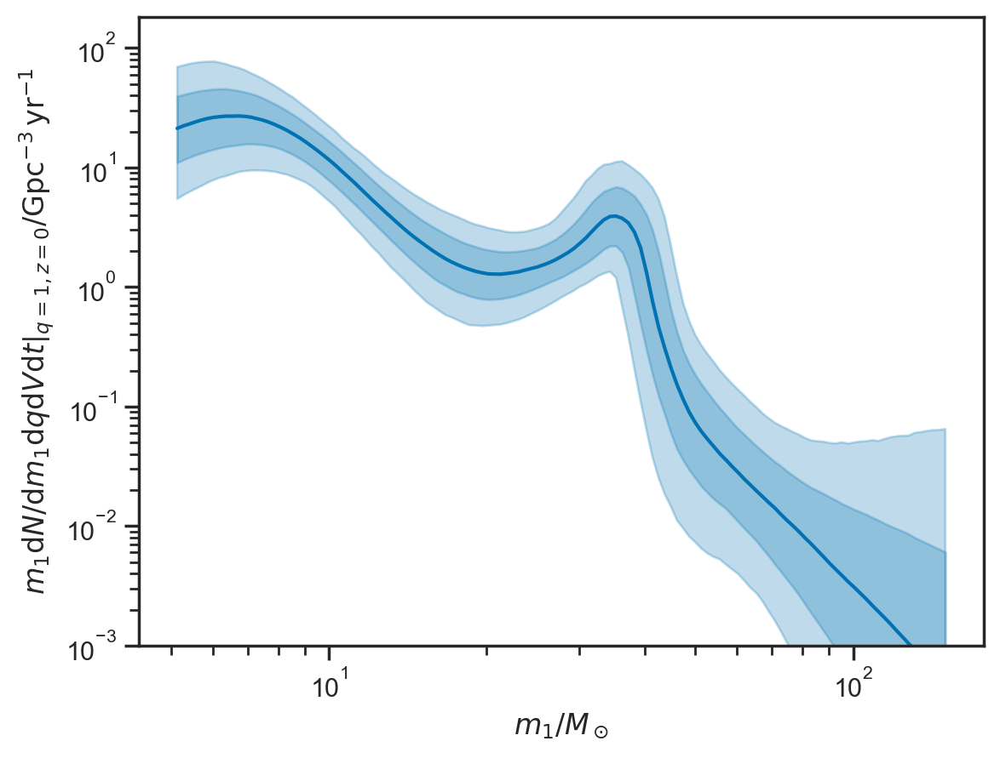

In [76]:
d = ['chain', 'draw']
m = trace_cosmo.posterior.coords['m_grid']
dN = trace_cosmo.posterior['mdNdmdVdt_fixed_qz']
l, = plt.plot(m[1:], dN.median(dim=d)[1:])
c = l.get_color()
for (l,h) in [(0.16, 0.84), (0.025, 0.975)]:
    plt.fill_between(m[1:], dN.quantile(h, dim=d)[1:], dN.quantile(l, dim=d)[1:], color=c, alpha=0.25)
plt.xscale('log')
plt.yscale('log')
plt.ylim(bottom=1e-3)
plt.xlabel(r'$m_1 / M_\odot$')
plt.ylabel(r'$\left. m_1 \mathrm{d} N/\mathrm{d} m_1 \mathrm{d} q \mathrm{d} V \mathrm{d} t \right|_{q=1, z=0} / \mathrm{Gpc}^{-3} \, \mathrm{yr}^{-1}$')

Text(0, 0.5, '$\\left. m_1 \\mathrm{d} N/\\mathrm{d} m_1 \\mathrm{d} q \\mathrm{d} V \\mathrm{d} t \\right|_{m_1=30\\,M_\\odot, z=0} / \\mathrm{Gpc}^{-3} \\, \\mathrm{yr}^{-1}$')

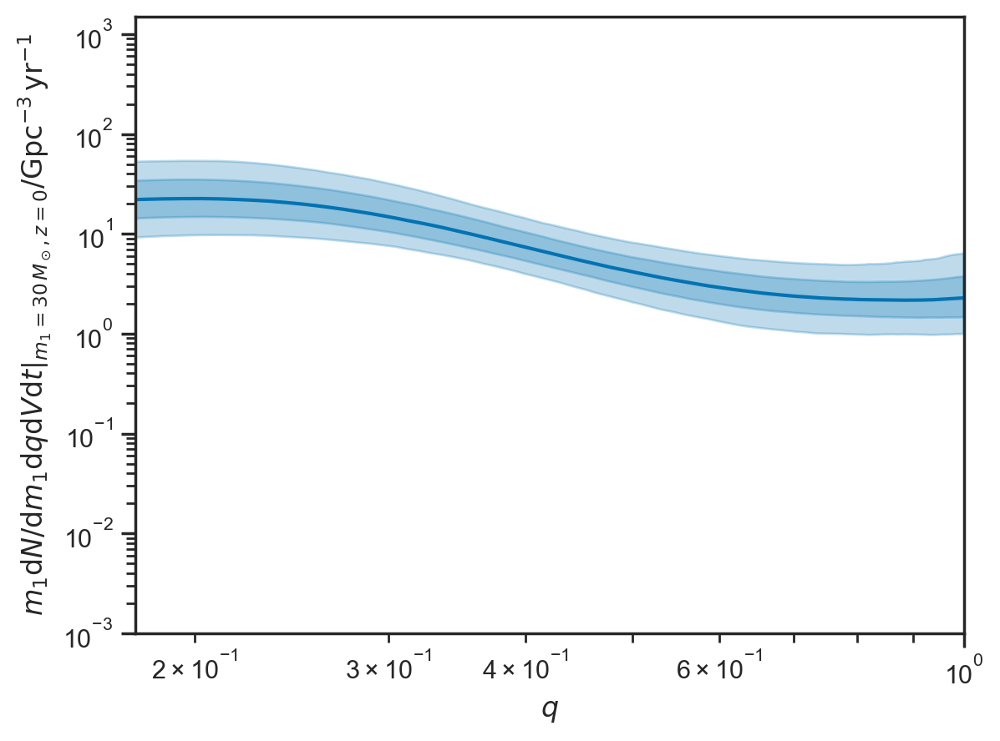

In [77]:
d = ['chain', 'draw']
q = trace_cosmo.posterior.coords['q_grid']
dN = trace_cosmo.posterior['dNdqdVdt_fixed_mz']
l, = plt.plot(q, dN.median(dim=d))
c = l.get_color()
for (l,h) in [(0.16, 0.84), (0.025, 0.975)]:
    plt.fill_between(q, dN.quantile(h, dim=d), dN.quantile(l, dim=d), color=c, alpha=0.25)
plt.xscale('log')
plt.yscale('log')
plt.xlim(left=5/30+0.01, right=1)
plt.ylim(bottom=1e-3)
plt.xlabel(r'$q$')
plt.ylabel(r'$\left. m_1 \mathrm{d} N/\mathrm{d} m_1 \mathrm{d} q \mathrm{d} V \mathrm{d} t \right|_{m_1=30\,M_\odot, z=0} / \mathrm{Gpc}^{-3} \, \mathrm{yr}^{-1}$')

Text(0, 0.5, '$\\left. m_1 \\mathrm{d} N/\\mathrm{d} m_1 \\mathrm{d} q \\mathrm{d} V \\mathrm{d} t \\right|_{m_1=30\\,M_\\odot, q=1} / \\mathrm{Gpc}^{-3} \\, \\mathrm{yr}^{-1}$')

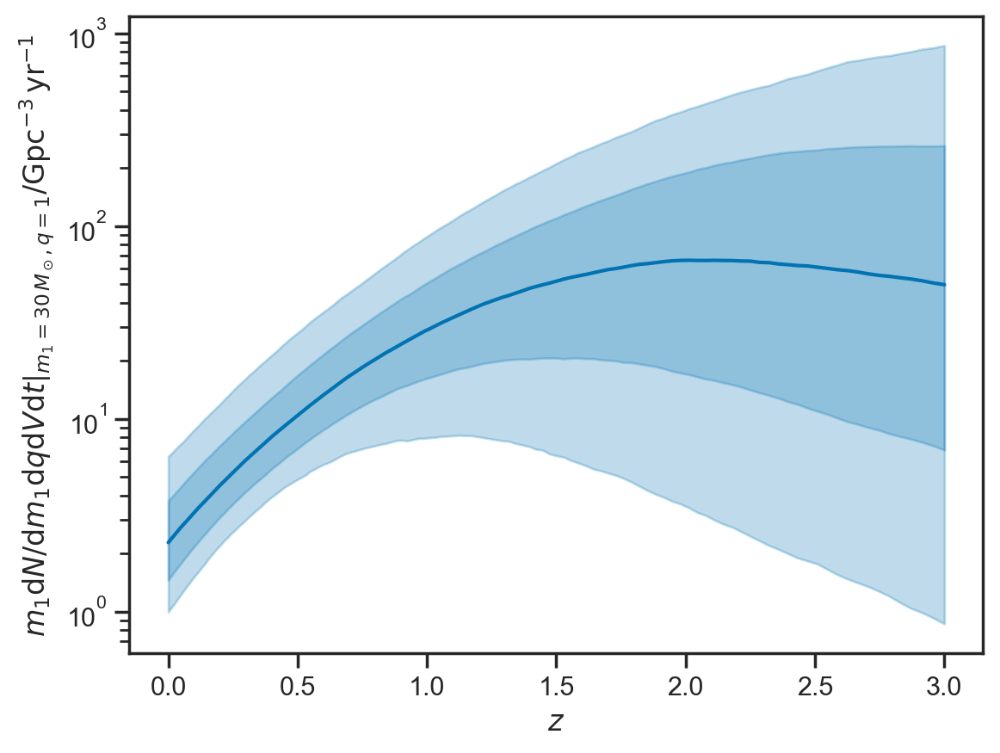

In [78]:
d = ['chain', 'draw']
z = trace_cosmo.posterior.coords['z_grid']
dN = trace_cosmo.posterior['dNdVdt_fixed_mq']
l, = plt.plot(z, dN.median(dim=d))
c = l.get_color()
for (l,h) in [(0.16, 0.84), (0.025, 0.975)]:
    plt.fill_between(z, dN.quantile(h, dim=d), dN.quantile(l, dim=d), color=c, alpha=0.25)
plt.yscale('log')
plt.xlabel(r'$z$')
plt.ylabel(r'$\left. m_1 \mathrm{d} N/\mathrm{d} m_1 \mathrm{d} q \mathrm{d} V \mathrm{d} t \right|_{m_1=30\,M_\odot, q=1} / \mathrm{Gpc}^{-3} \, \mathrm{yr}^{-1}$')

Text(0, 0.5, '$h(z)$')

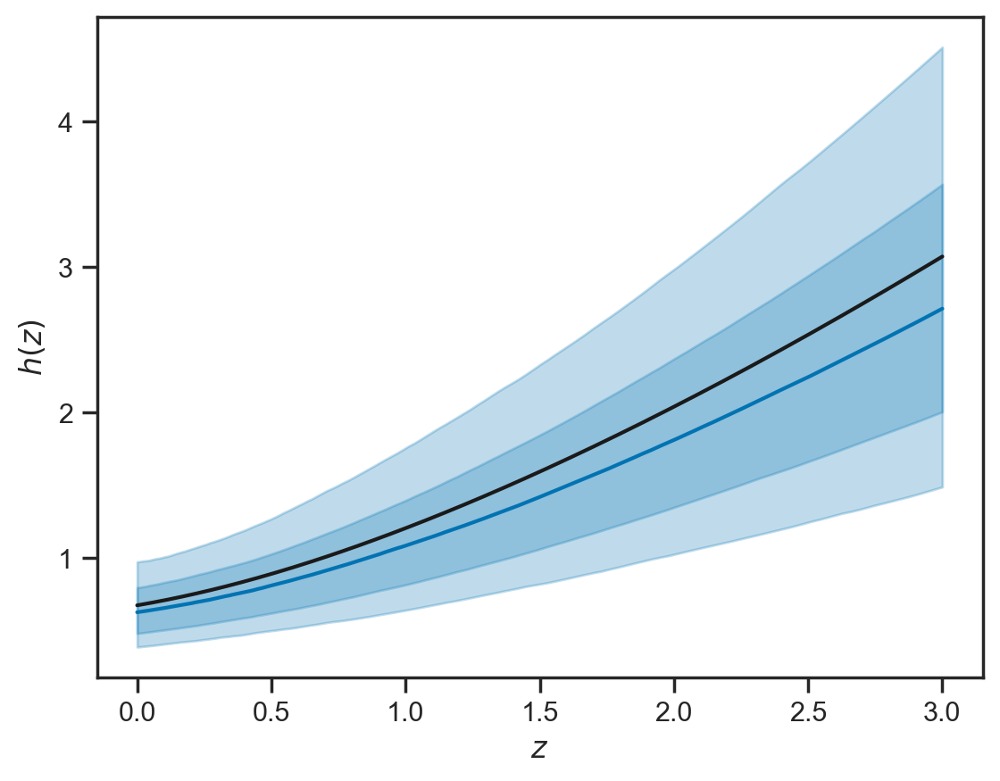

In [79]:
d = ['chain', 'draw']
z = trace_cosmo.posterior.coords['z_grid']
hz = trace_cosmo.posterior.hz
l, = plt.plot(z, hz.median(dim=d))
c = l.get_color()
for (l,h) in [(0.16, 0.84), (0.025, 0.975)]:
    plt.fill_between(z, hz.quantile(h, dim=d), hz.quantile(l, dim=d), color=c, alpha=0.25)
plt.plot(z, Planck18.h*Planck18.efunc(z), color='k')
plt.xlabel(r'$z$')
plt.ylabel(r'$h(z)$')


array([[<Axes: ylabel='Om'>, <Axes: >],
       [<Axes: xlabel='h', ylabel='w'>, <Axes: xlabel='Om'>]],
      dtype=object)

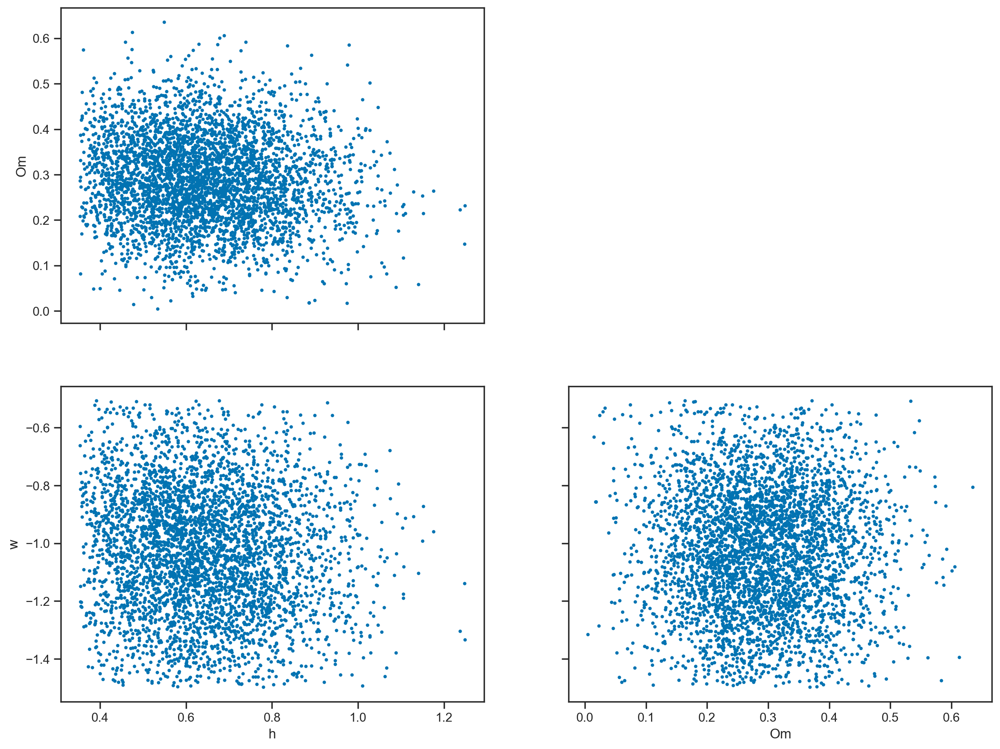

In [80]:
az.plot_pair(trace_cosmo, var_names=['h', 'Om', 'w'])

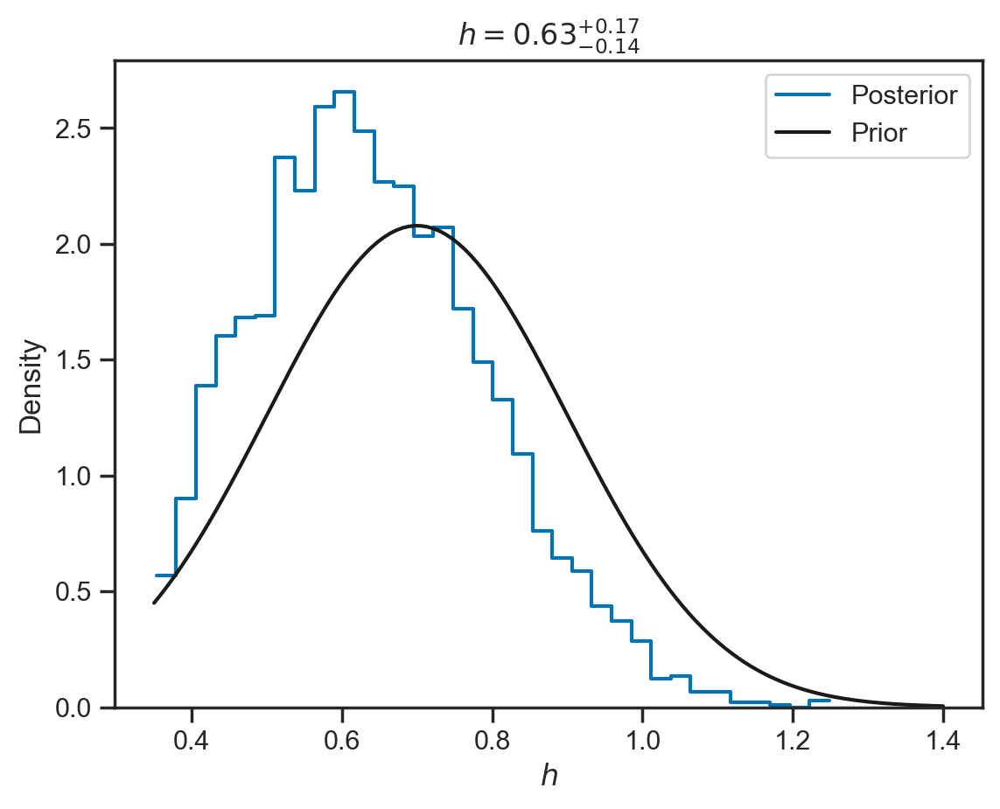

In [81]:
sns.histplot(trace_cosmo.posterior.h.values.flatten(), stat='density', element='step', fill=False, label='Posterior')
hs = np.linspace(0.35, 1.4, 128)
d = ss.norm(loc=0.7, scale=0.2)
plt.plot(hs, d.pdf(hs)/(d.cdf(1.4)-d.cdf(0.35)), color='k', label='Prior')
hs = trace_cosmo.posterior.h
m = hs.median()
h = hs.quantile(0.84)
l = hs.quantile(0.16)
plt.title(r'$h = {:.2f}^{{+{:.2f}}}_{{-{:.2f}}}$'.format(m, h-m, m-l))
plt.xlabel(r'$h$')
plt.legend()